In [1]:
import pandas as pd
from scipy.stats import iqr
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.ensemble import VotingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

**Handling missing values** : Missing values were identified using the .isnull() function, and their counts and percentages were calculated. Appropriate handling included dropping columns with excessive missingness and imputing numerical values using mean/median and categorical values using mode.
















In [17]:
weather_data = pd.read_csv('/content/GlobalWeatherRepository[1].csv')

In [18]:
def display_table(df, title):
    print(f"\n{title}\n")
    print(df)
def check_missing_values(data):
    missing_values = data.isnull().sum()
    total_rows = len(data)
    percent_missing = (missing_values / total_rows) * 100
    missing_summary = pd.DataFrame({
        'Missing Values': missing_values,
        'Percentage Missing': percent_missing
    })
    display_table(missing_summary, "Missing Values Summary")
    return missing_summary
missing_values = check_missing_values(weather_data)



Missing Values Summary

                              Missing Values  Percentage Missing
country                                    0                 0.0
location_name                              0                 0.0
latitude                                   0                 0.0
longitude                                  0                 0.0
timezone                                   0                 0.0
last_updated_epoch                         0                 0.0
last_updated                               0                 0.0
temperature_celsius                        0                 0.0
temperature_fahrenheit                     0                 0.0
condition_text                             0                 0.0
wind_mph                                   0                 0.0
wind_kph                                   0                 0.0
wind_degree                                0                 0.0
wind_direction                             0                 0.0


Code for analyzing numerical and categorical columns , if it is numerical we are finding its mean , min , max or if it is categorical finding its mode


In [19]:
def analyze_columns(data):

    analysis = {}
    for column in data.columns:
        if data[column].dtype in ['int64', 'float64']:
            analysis[column] = {
                'Type': 'Numerical',
                'Mean': data[column].mean(),
                'Min': data[column].min(),
                'Max': data[column].max()
            }
        elif data[column].dtype == 'object':
            analysis[column] = {
                'Type': 'Categorical',
                'Mode': data[column].mode()[0]
            }
    analysis_df = pd.DataFrame.from_dict(analysis, orient='index')
    display_table(analysis_df, "Column Analysis")
    return analysis_df
column_analysis = analyze_columns(weather_data)


Column Analysis

                                     Type              Mode          Mean  \
country                       Categorical          Bulgaria           NaN   
location_name                 Categorical         Abu Dhabi           NaN   
latitude                        Numerical               NaN  1.914316e+01   
longitude                       Numerical               NaN  2.221001e+01   
timezone                      Categorical      Asia/Bangkok           NaN   
last_updated_epoch              Numerical               NaN  1.726313e+09   
last_updated                  Categorical  2024-10-27 10:15           NaN   
temperature_celsius             Numerical               NaN  2.326910e+01   
temperature_fahrenheit          Numerical               NaN  7.388580e+01   
condition_text                Categorical     Partly cloudy           NaN   
wind_mph                        Numerical               NaN  8.306815e+00   
wind_kph                        Numerical               Na

Normalizing the data using Minmax Scaler

In [20]:
def normalize_data(data):
    scaler = MinMaxScaler()
    numerical_columns = data.select_dtypes(include=['float64', 'int64']).columns
    data[numerical_columns] = scaler.fit_transform(data[numerical_columns])
    display_table(data.head(), "Normalized Data Preview")
    return data
weather_data = normalize_data(weather_data)


Normalized Data Preview

       country     location_name  latitude  longitude        timezone  \
0  Afghanistan             Kabul  0.719014   0.689521      Asia/Kabul   
1      Albania            Tirana  0.783594   0.550251   Europe/Tirane   
2      Algeria           Algiers  0.740256   0.502934  Africa/Algiers   
3      Andorra  Andorra La Vella  0.794689   0.498617  Europe/Andorra   
4       Angola            Luanda  0.307824   0.531657   Africa/Luanda   

   last_updated_epoch      last_updated  temperature_celsius  \
0                 0.0  2024-05-16 13:15             0.694595   
1                 0.0  2024-05-16 10:45             0.591892   
2                 0.0  2024-05-16 09:45             0.645946   
3                 0.0  2024-05-16 10:45             0.420270   
4                 0.0  2024-05-16 09:45             0.686486   

   temperature_fahrenheit condition_text  ...  air_quality_PM2.5  \
0                0.693694  Partly Cloudy  ...           0.005090   
1             

Finding Outliers

In [21]:
def find_outliers(data):
    """Function to identify outliers in numerical columns based on the IQR method."""
    outlier_summary = {}
    for column in data.select_dtypes(include=['float64', 'int64']).columns:
        q1 = data[column].quantile(0.25)
        q3 = data[column].quantile(0.75)
        iqr_value = iqr(data[column])
        lower_bound = q1 - 1.5 * iqr_value
        upper_bound = q3 + 1.5 * iqr_value

        outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]

        outlier_summary[column] = {
            'Total Outliers': len(outliers),
            'Lower Bound': lower_bound,
            'Upper Bound': upper_bound
        }
    outlier_df = pd.DataFrame.from_dict(outlier_summary, orient='index')
    display_table(outlier_df, "Outlier Summary")
    return outlier_df
outliers = find_outliers(weather_data)



Outlier Summary

                              Total Outliers  Lower Bound  Upper Bound
latitude                                   0    -0.094120     1.296112
longitude                               3613     0.236175     0.877561
last_updated_epoch                         0    -0.516543     1.512800
temperature_celsius                     1527     0.372297     0.939865
temperature_fahrenheit                  1527     0.371997     0.939565
wind_mph                                 593    -0.005220     0.011310
wind_kph                                 593    -0.005203     0.011285
wind_degree                                0    -0.500000     1.449861
pressure_mb                             3058     0.261468     0.518349
pressure_in                             3146     0.267081     0.515528
precip_mm                               9092    -0.001065     0.001776
precip_in                               7643     0.000000     0.000000
humidity                                   0    -0.142857  

 Function to handle outliers in numerical columns clipping


In [24]:
def handle_outliers_with_median(data):
    for column in data.select_dtypes(include=['float64', 'int64']).columns:
        q1 = data[column].quantile(0.25)
        q3 = data[column].quantile(0.75)
        iqr_value = q3 - q1
        lower_bound = q1 - 1.5 * iqr_value
        upper_bound = q3 + 1.5 * iqr_value

        data[column] = data[column].clip(lower=lower_bound, upper=upper_bound)

    return data


weather_data_cleaned = handle_outliers_with_median(weather_data)
outliers_after = find_outliers(weather_data_cleaned)



Outlier Summary

                              Total Outliers  Lower Bound  Upper Bound
latitude                                   0    -0.094120     1.296112
longitude                                  0     0.305706     0.807070
last_updated_epoch                         0    -0.516543     1.512800
temperature_celsius                        0     0.422973     0.909459
temperature_fahrenheit                     0     0.422673     0.909159
wind_mph                                   0    -0.004894     0.010767
wind_kph                                   0    -0.004849     0.010694
wind_degree                                0    -0.500000     1.449861
pressure_mb                                0     0.275229     0.495413
pressure_in                                0     0.281056     0.492236
precip_mm                                  0     0.000000     0.000000
precip_in                                  0     0.000000     0.000000
humidity                                   0    -0.142857  

Potting hisogram and boxplot for numerical columns

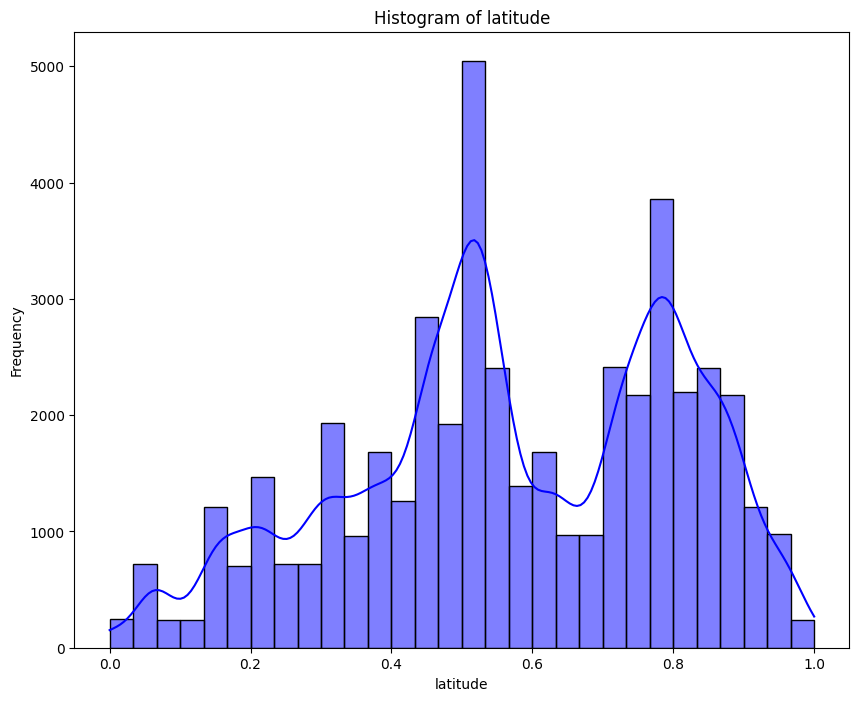

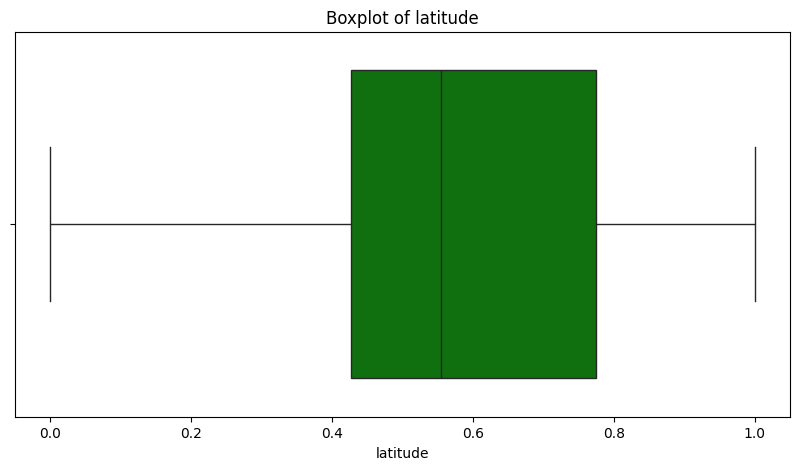

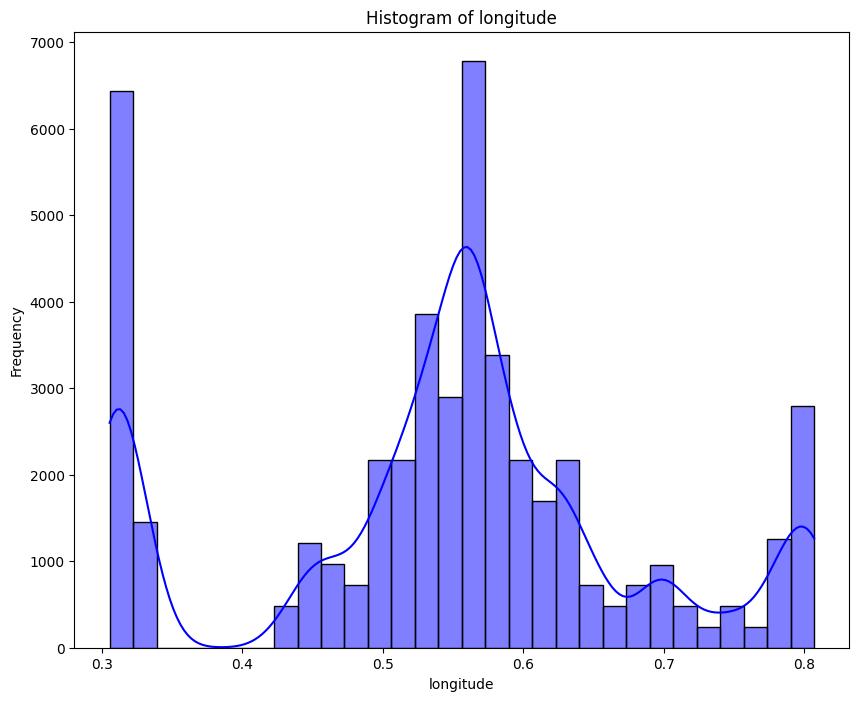

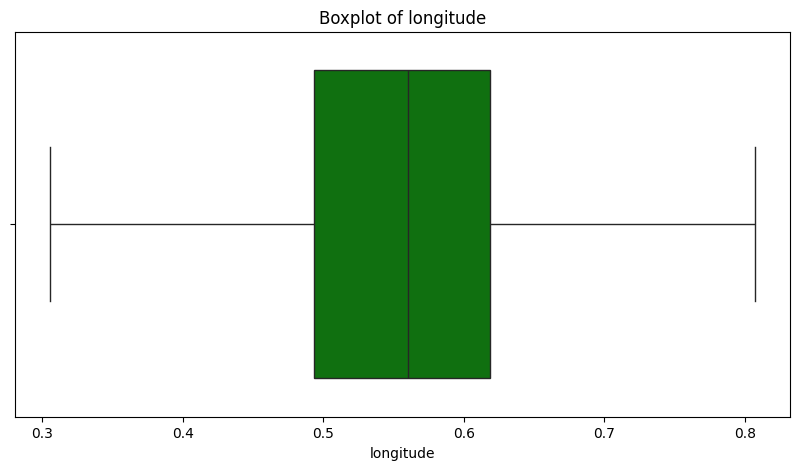

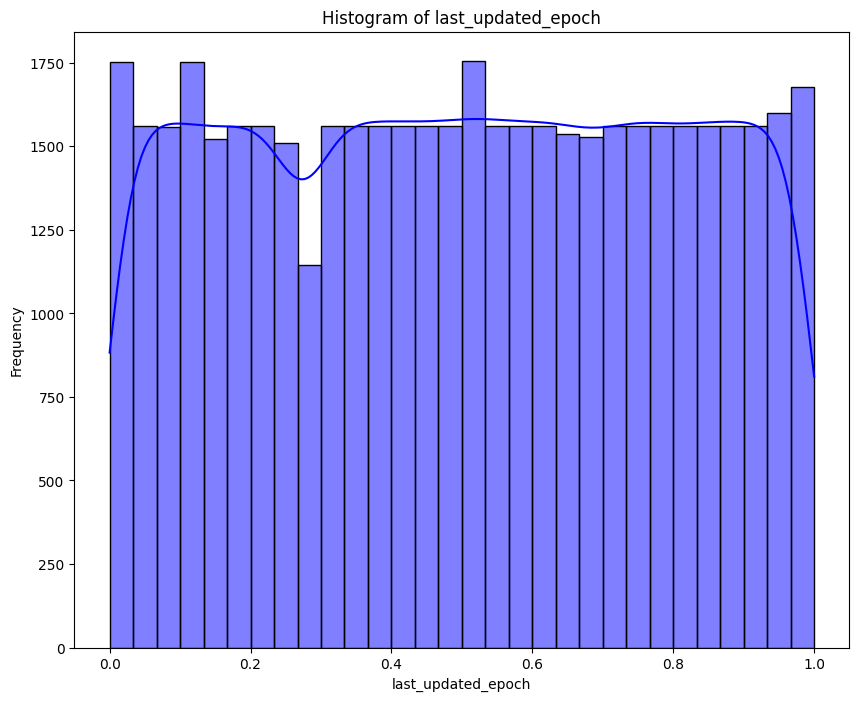

...

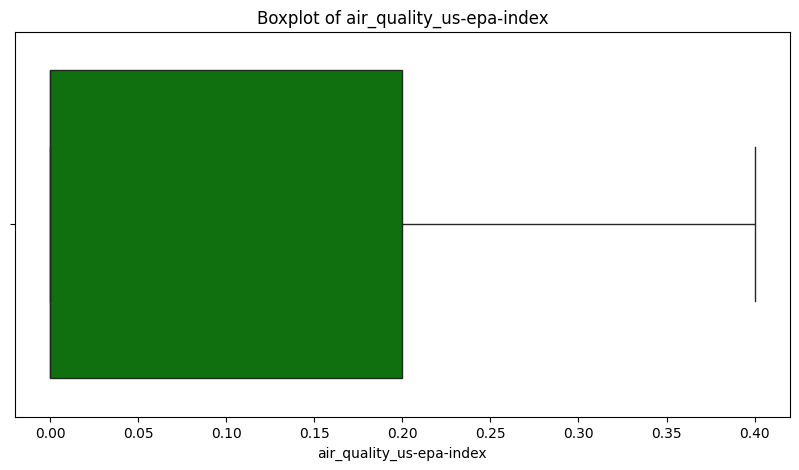

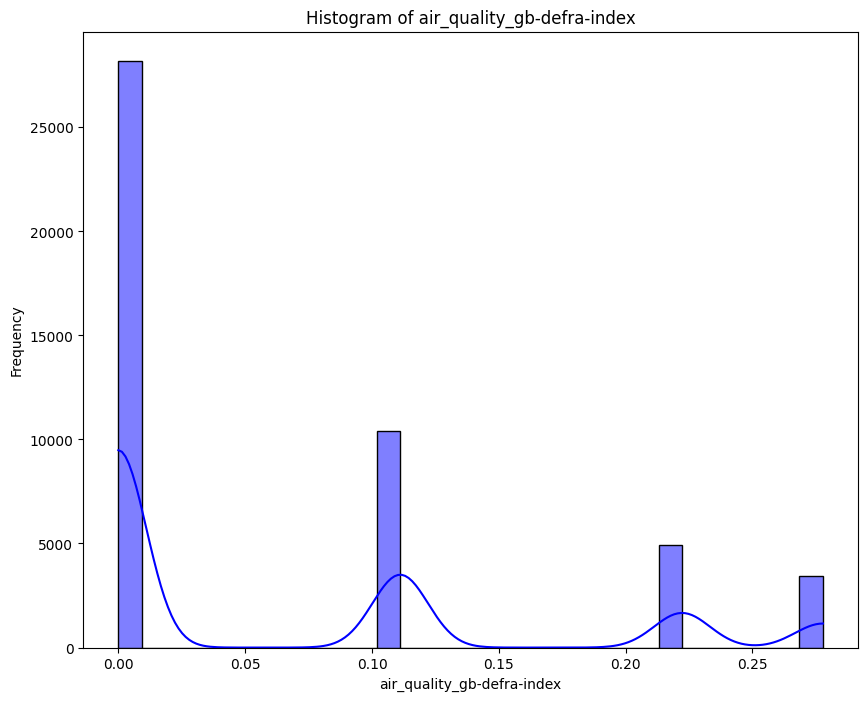

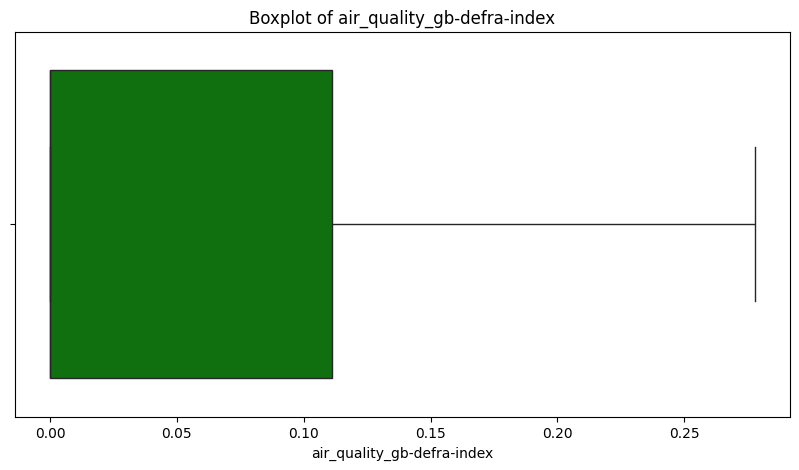

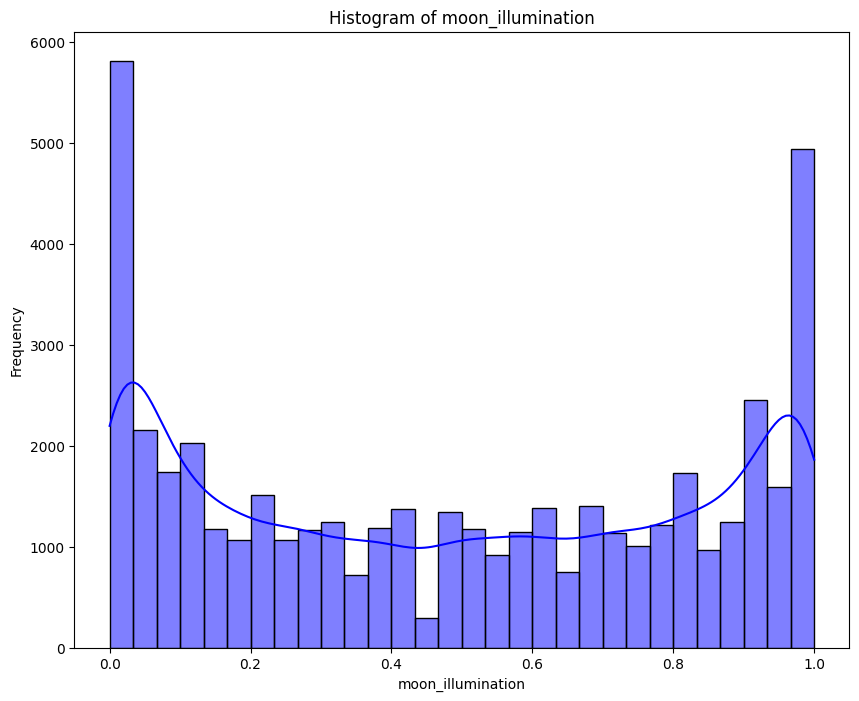

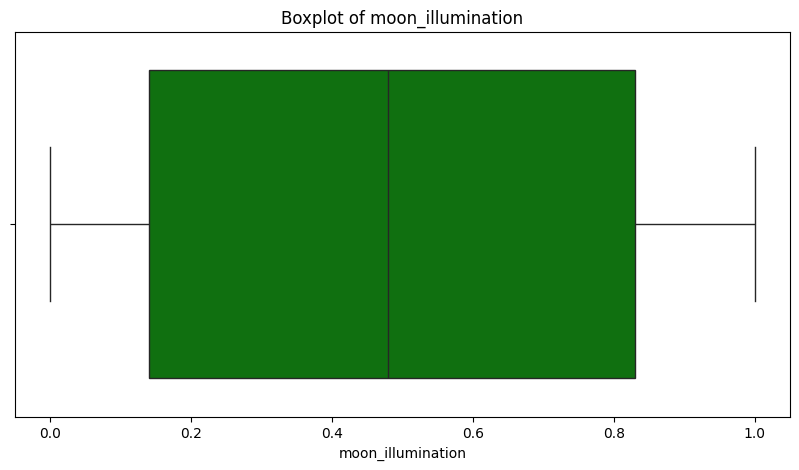

None


In [26]:
def plot_columns_numerical(data):
    for column in data.columns:
        if data[column].dtype in ['int64', 'float64']:
            plt.figure(figsize=(10,8))
            sns.histplot(data[column], kde=True, bins=30, color='blue')
            plt.title(f"Histogram of {column}")
            plt.xlabel(column)
            plt.ylabel("Frequency")
            plt.show()

            plt.figure(figsize=(10, 5))
            sns.boxplot(x=data[column], color='green')
            plt.title(f"Boxplot of {column}")
            plt.xlabel(column)
            plt.show()


plot=plot_columns_numerical(weather_data)
print(plot)

Plotting bar chart for categorical columns

<ipython-input-35-9b3bc7ff289c>:10: UserWarning: Glyph 28779 (\N{CJK UNIFIED IDEOGRAPH-706B}) missing from current font.
  plt.tight_layout()  # Adjust layout to avoid overlapping
<ipython-input-35-9b3bc7ff289c>:10: UserWarning: Glyph 40481 (\N{CJK UNIFIED IDEOGRAPH-9E21}) missing from current font.
  plt.tight_layout()  # Adjust layout to avoid overlapping
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 28779 (\N{CJK UNIFIED IDEOGRAPH-706B}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 40481 (\N{CJK UNIFIED IDEOGRAPH-9E21}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


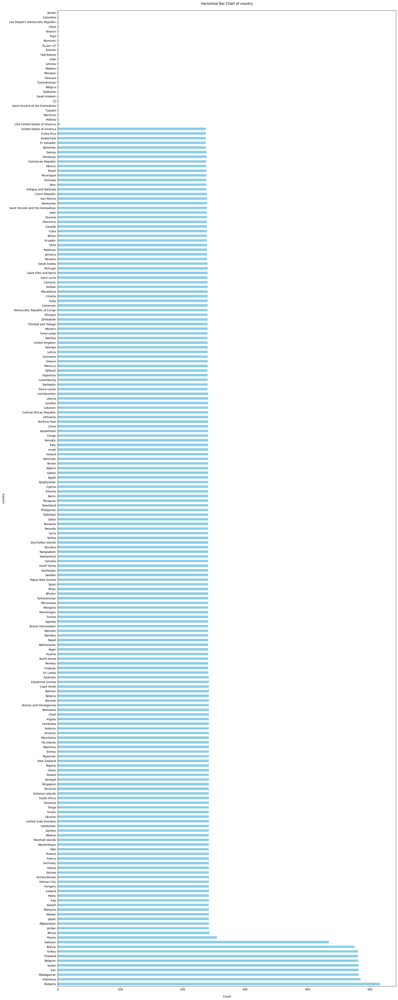

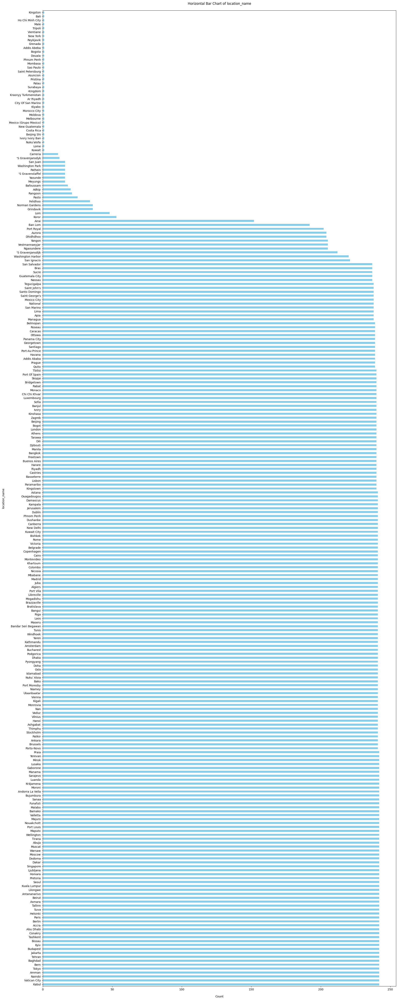

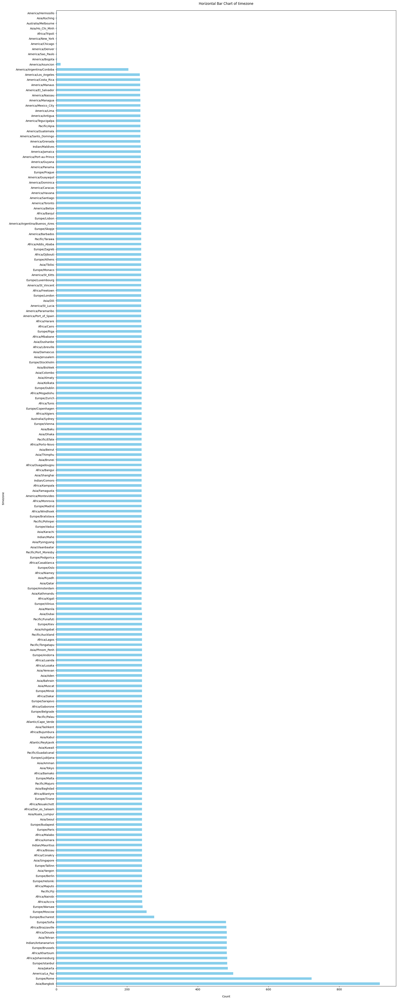

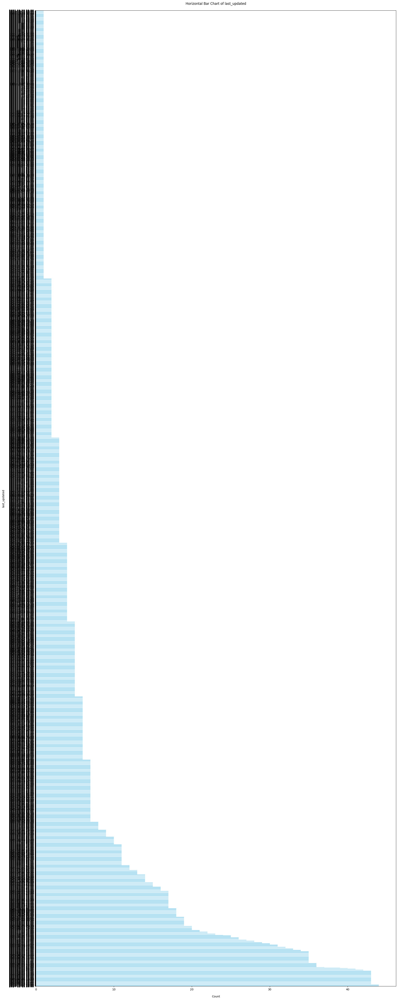

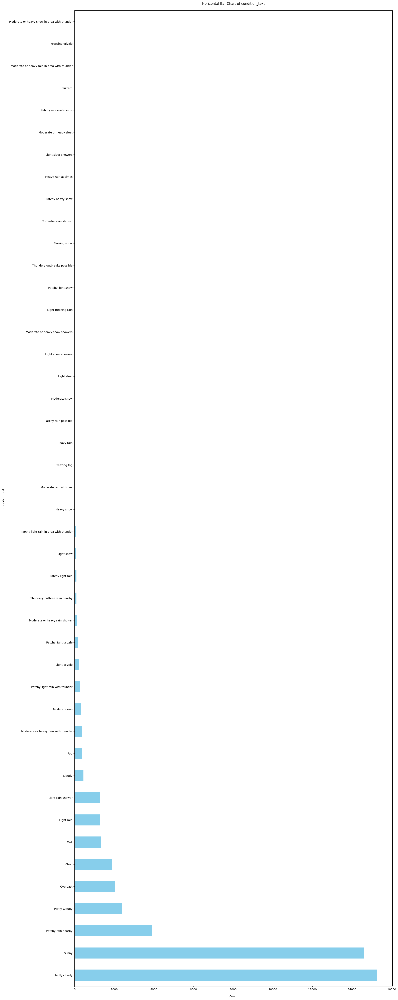

...

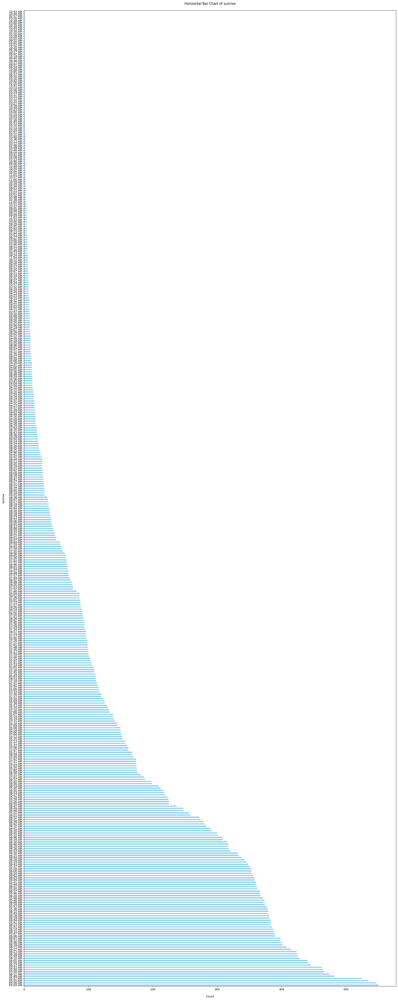

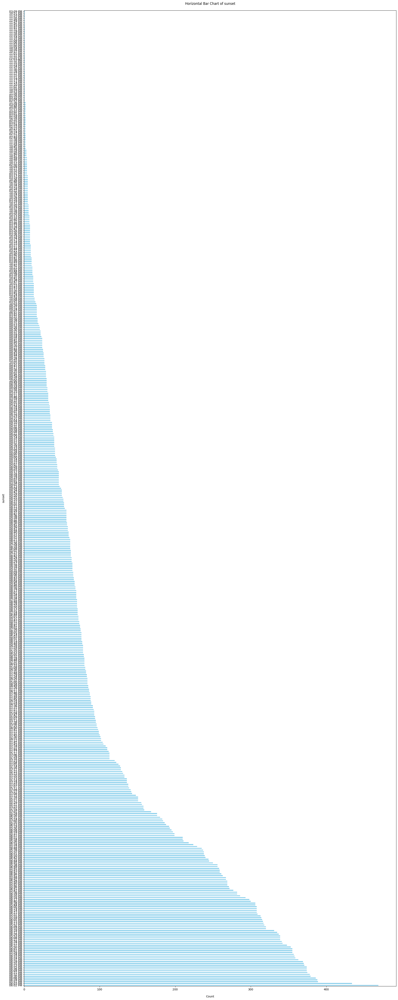

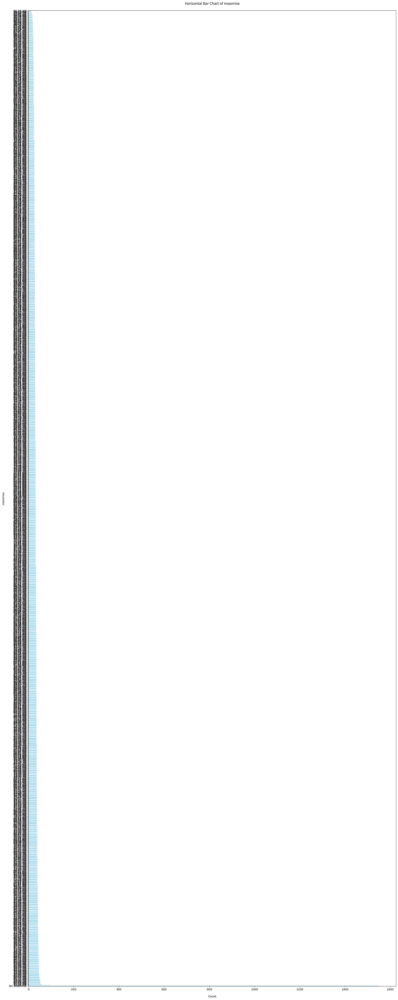

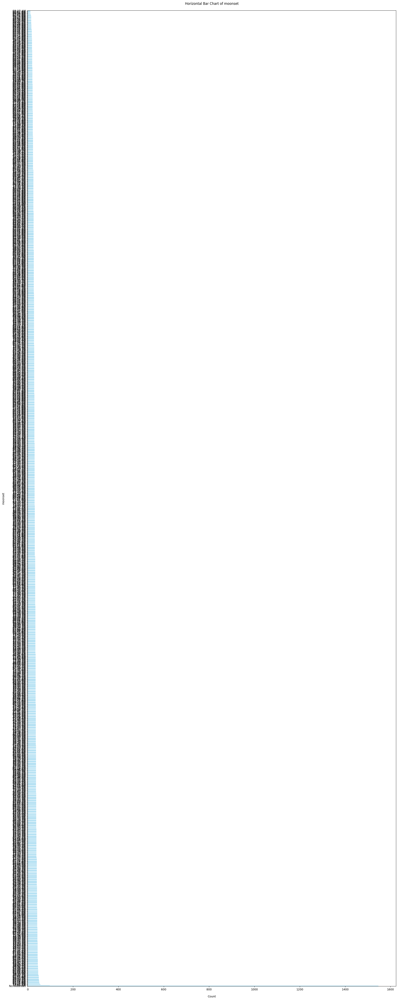

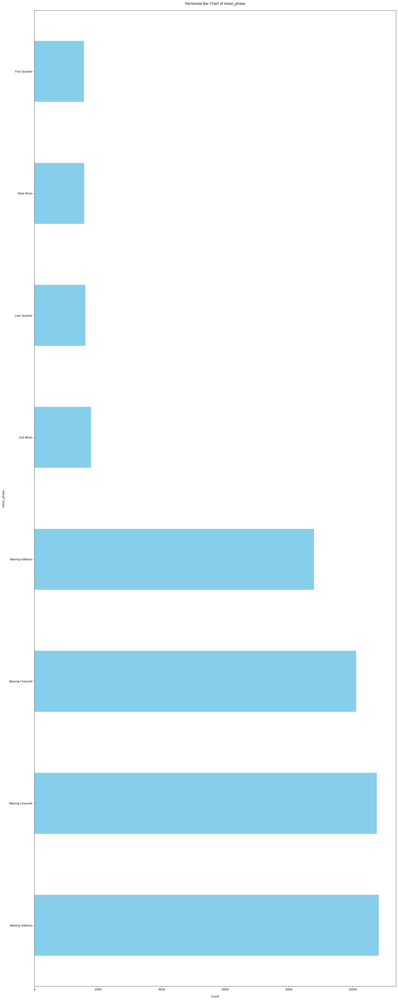

None


In [35]:
def plot_horizontal_bar_chart(data):
    for column in data.columns:
        if data[column].dtype == 'object':
            plt.figure(figsize=(20, 50))
            data[column].value_counts().plot(kind='barh', color='skyblue')
            plt.title(f"Horizontal Bar Chart of {column}", pad=20)
            plt.xlabel("Count", labelpad=15)
            plt.ylabel(column, labelpad=15)
            plt.tight_layout()
            plt.show()


plot_horizontal_bar_chart(weather_data)
print(plot)


Caluclating corelation

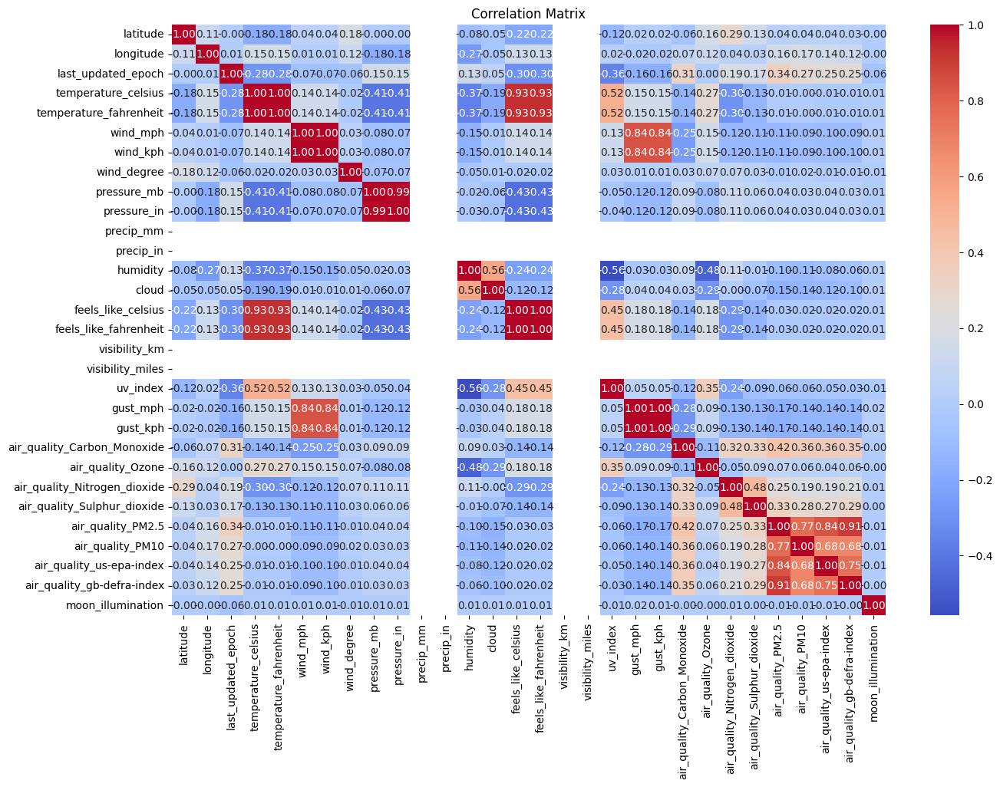

                              latitude  longitude  last_updated_epoch  \
latitude                      1.000000   0.112345           -0.000103   
longitude                     0.112345   1.000000            0.005660   
last_updated_epoch           -0.000103   0.005660            1.000000   
temperature_celsius          -0.181630   0.154630           -0.284384   
temperature_fahrenheit       -0.181671   0.154598           -0.284443   
wind_mph                      0.042545   0.013905           -0.073142   
wind_kph                      0.042698   0.013710           -0.073264   
wind_degree                   0.178316   0.123216           -0.059746   
pressure_mb                  -0.002491  -0.183645            0.153713   
pressure_in                  -0.003755  -0.181710            0.151825   
precip_mm                          NaN        NaN                 NaN   
precip_in                          NaN        NaN                 NaN   
humidity                     -0.083007  -0.267008  

In [37]:
def calculate_correlation(data):
    numerical_data = data.select_dtypes(include=['float64', 'int64'])
    correlation_matrix = numerical_data.corr()
    plt.figure(figsize=(15, 10))
    sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
    plt.title("Correlation Matrix")
    plt.show()
    return correlation_matrix

correlation_matrix = calculate_correlation(weather_data)
print(correlation_matrix)

Plotting temperature and precipitation

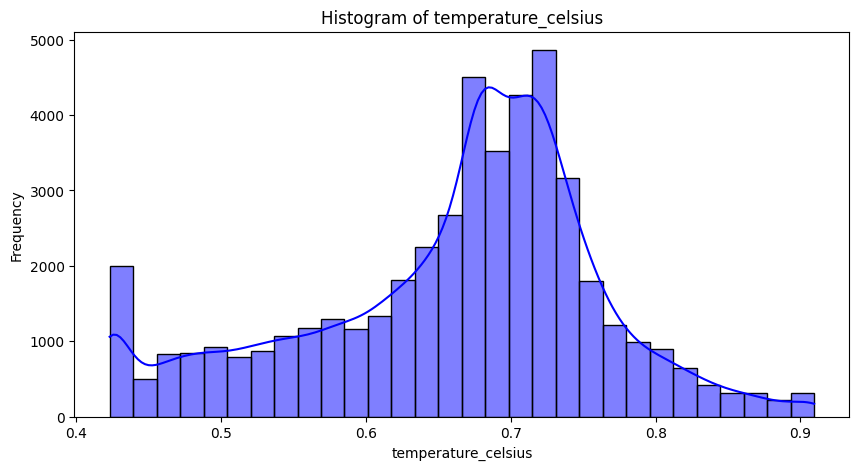

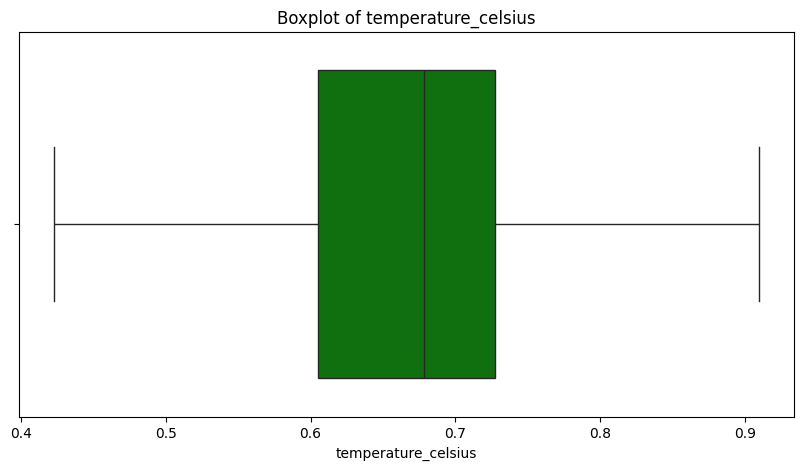

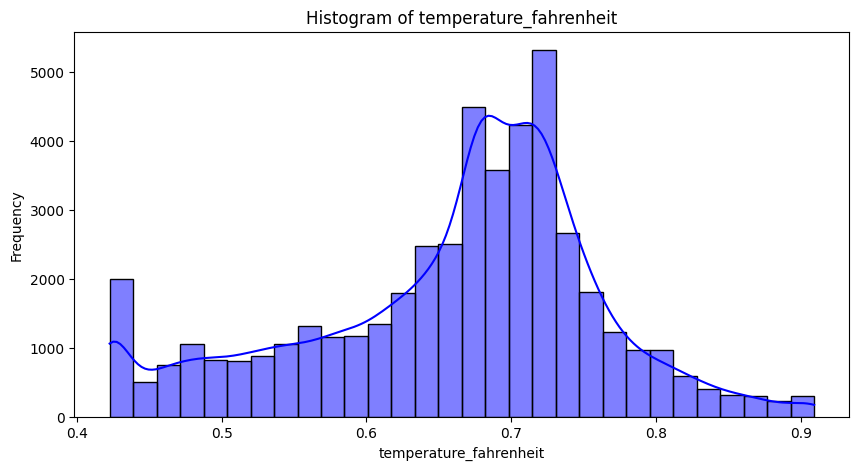

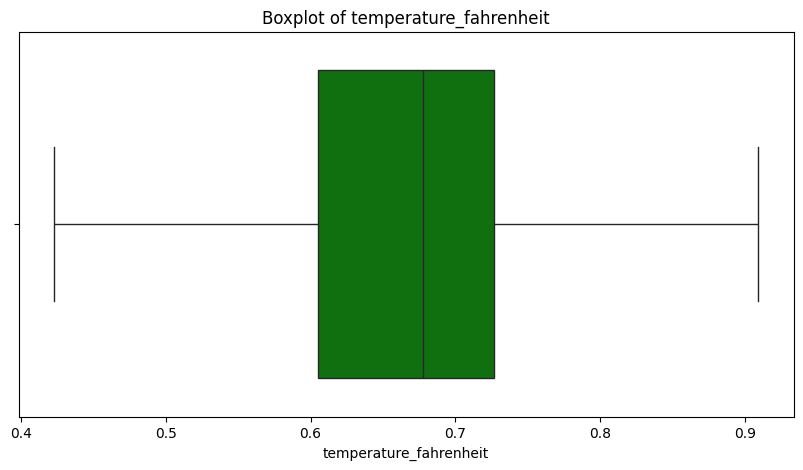

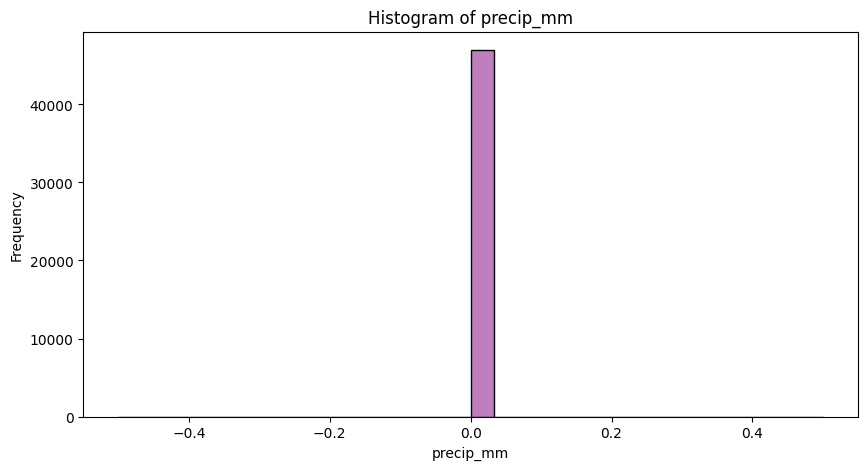

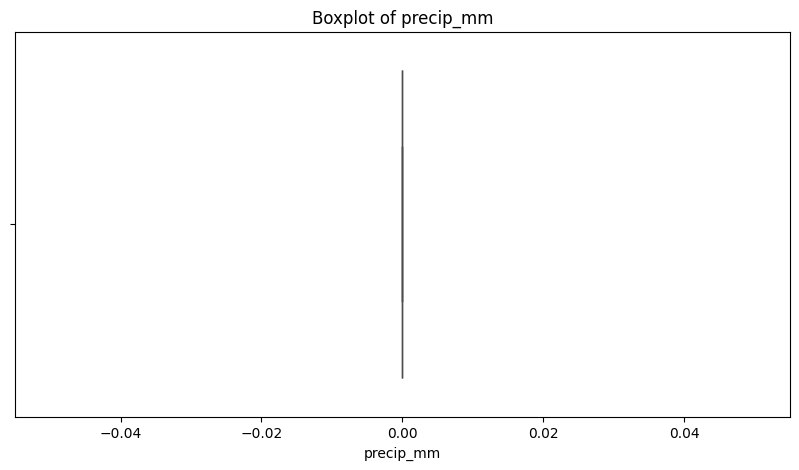

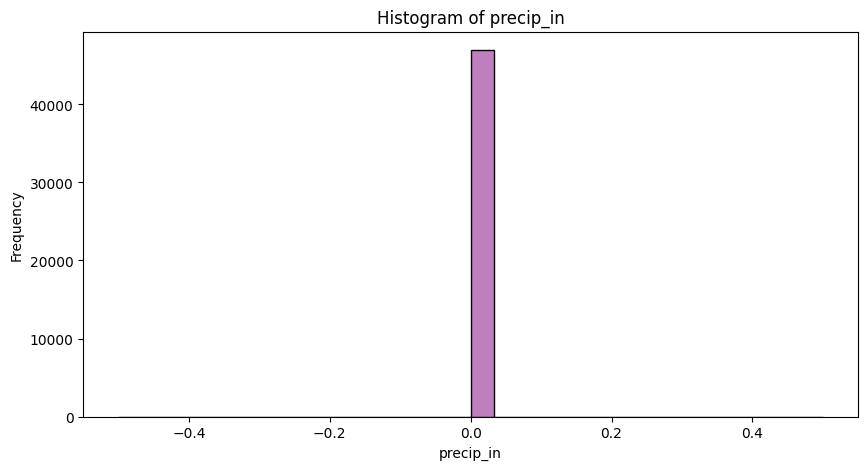

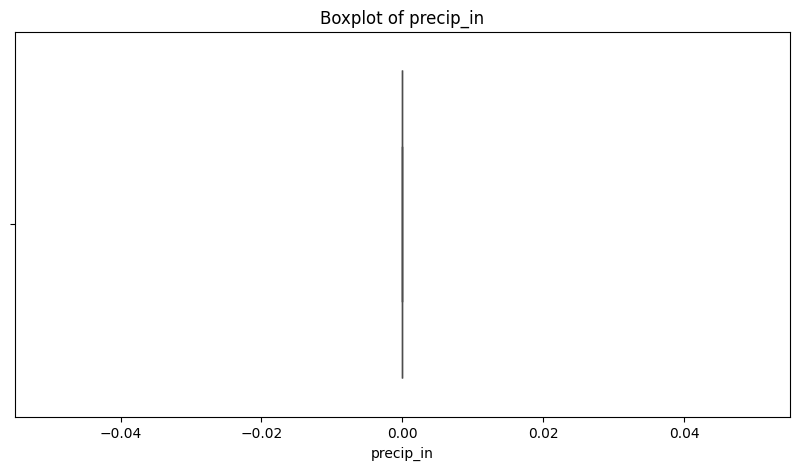

None


In [38]:
def plot_temperature_and_precipitation(data):
    temperature_columns = [col for col in data.columns if 'temperature' in col.lower()]
    precipitation_columns = [col for col in data.columns if 'precip' in col.lower()]

    for col in temperature_columns:
        plt.figure(figsize=(10, 5))
        sns.histplot(data[col], kde=True, bins=30, color='blue')
        plt.title(f"Histogram of {col}")
        plt.xlabel(col)
        plt.ylabel("Frequency")
        plt.show()

        plt.figure(figsize=(10, 5))
        sns.boxplot(x=data[col], color='green')
        plt.title(f"Boxplot of {col}")
        plt.xlabel(col)
        plt.show()

    for col in precipitation_columns:
        plt.figure(figsize=(10, 5))
        sns.histplot(data[col], kde=True, bins=30, color='purple')
        plt.title(f"Histogram of {col}")
        plt.xlabel(col)
        plt.ylabel("Frequency")
        plt.show()

        plt.figure(figsize=(10, 5))
        sns.boxplot(x=data[col], color='orange')
        plt.title(f"Boxplot of {col}")
        plt.xlabel(col)
        plt.show()
plot=plot_temperature_and_precipitation(weather_data)
print(plot)

Model Building

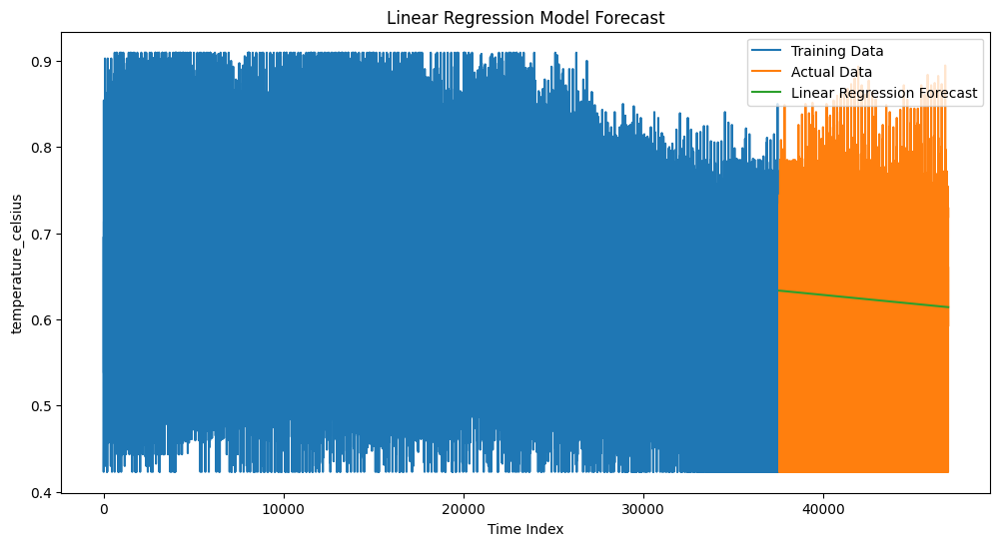

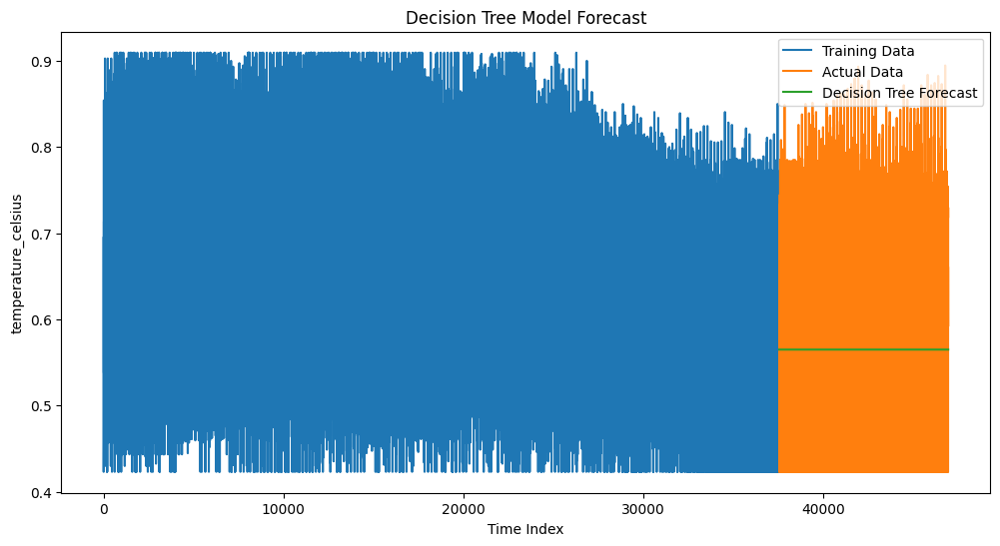

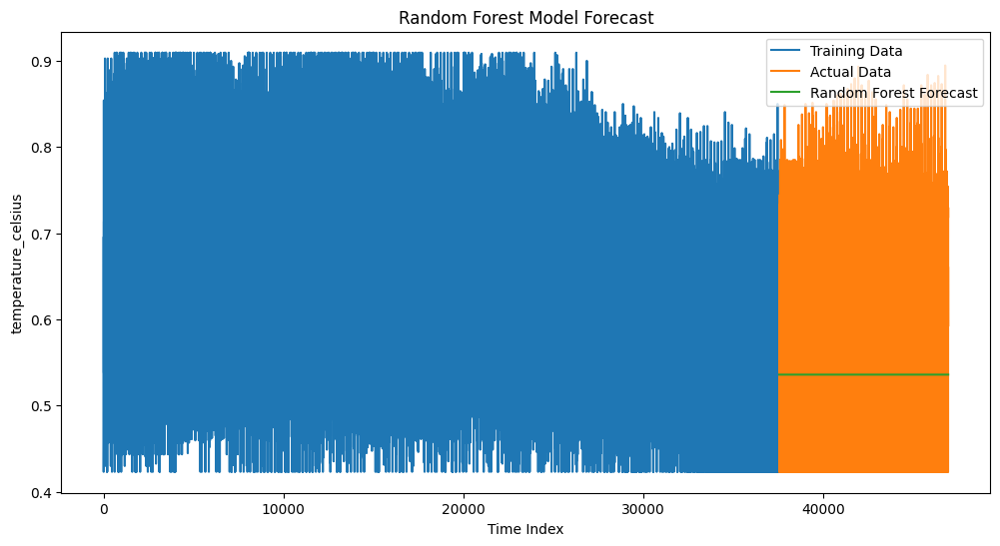

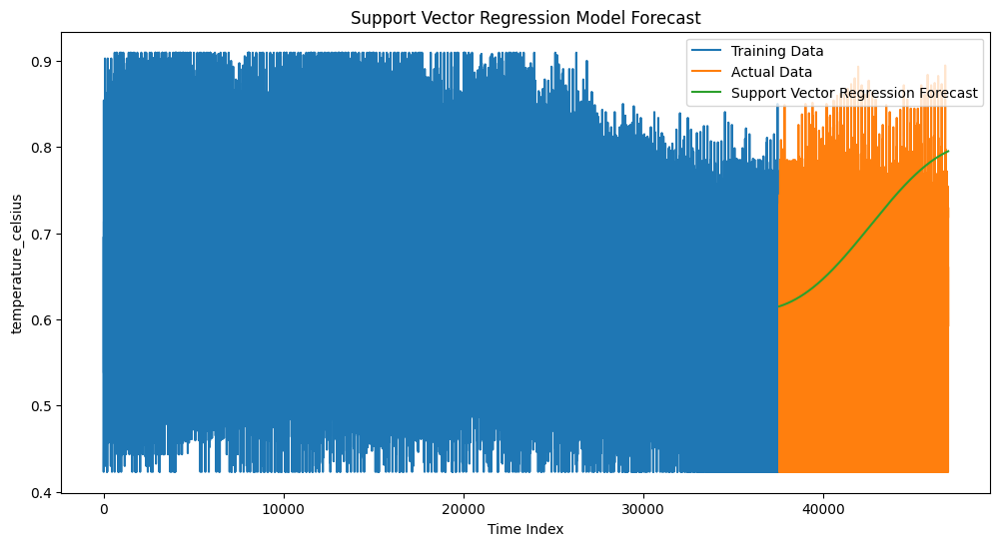

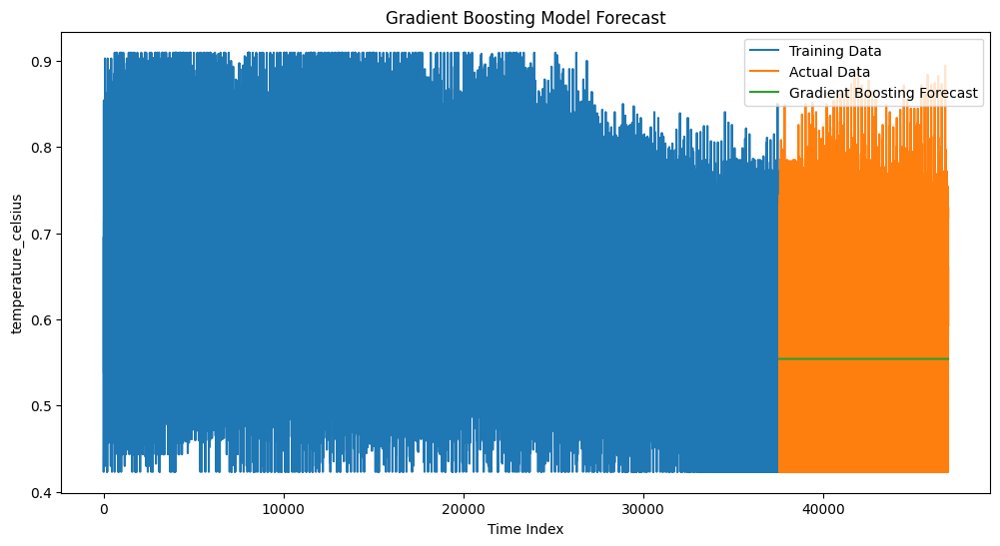

Model Performance:
                       Model      RMSE       MAE
0          Linear Regression  0.110313  0.093298
1              Decision Tree  0.121387  0.109803
2              Random Forest  0.136322  0.122388
3  Support Vector Regression  0.150082  0.118107
4          Gradient Boosting  0.126364  0.114186


In [42]:
import numpy as np
from sklearn.svm import SVR
from sklearn.ensemble import GradientBoostingRegressor
def apply_and_evaluate_regression_models(data, target_column):
    from sklearn.model_selection import train_test_split

    if 'last_updated_epoch' not in data.columns:
        raise KeyError("The 'last_updated_epoch' column is missing. Ensure it exists in the dataset.")

    data['last_updated'] = pd.to_datetime(data['last_updated_epoch'], unit='s')
    data.set_index('last_updated', inplace=True)

    y = data[target_column].dropna()
    X = np.arange(len(y)).reshape(-1, 1)

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)


    models = {
        "Linear Regression": LinearRegression(),
        "Decision Tree": DecisionTreeRegressor(),
        "Random Forest": RandomForestRegressor(),
        "Support Vector Regression": SVR(kernel='rbf'),
        "Gradient Boosting": GradientBoostingRegressor()
    }
    results = []
    for name, model in models.items():
        model.fit(X_train, y_train)
        forecast = model.predict(X_test)

        mse = mean_squared_error(y_test, forecast)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(y_test, forecast)

        results.append({
            "Model": name,
            "RMSE": rmse,
            "MAE": mae
        })
        plt.figure(figsize=(12, 6))
        plt.plot(X_train, y_train, label='Training Data')
        plt.plot(X_test, y_test, label='Actual Data')
        plt.plot(X_test, forecast, label=f'{name} Forecast')
        plt.legend()
        plt.title(f"{name} Model Forecast")
        plt.xlabel("Time Index")
        plt.ylabel(target_column)
        plt.show()


    results_df = pd.DataFrame(results)
    print("Model Performance:")
    print(results_df)

    return results_df


results = apply_and_evaluate_regression_models(weather_data, target_column='temperature_celsius')


Model Building using Ensemble Techniques

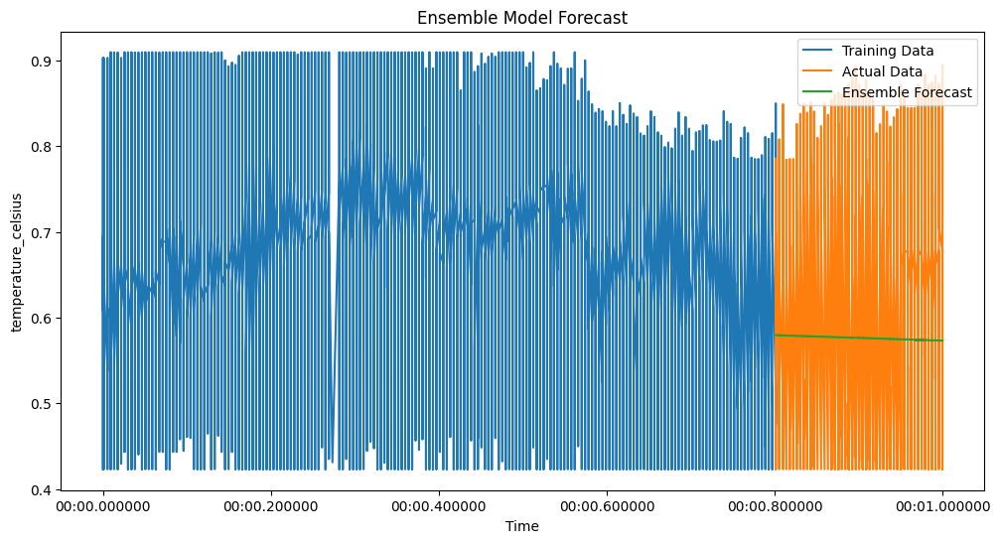

Ensemble Model Performance:
0.10565129741771392


In [45]:
from sklearn.ensemble import VotingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
import numpy as np

def ensemble_forecast(data, target_column):

    if 'last_updated_epoch' not in data.columns:
        raise KeyError("The 'last_updated_epoch' column is missing. Ensure it exists in the dataset.")

    data['last_updated'] = pd.to_datetime(data['last_updated_epoch'], unit='s')
    data.set_index('last_updated', inplace=True)

    y = data[target_column].dropna()
    train_size = int(len(y) * 0.8)
    y_train, y_test = y[:train_size], y[train_size:]

    X_train = np.arange(len(y_train)).reshape(-1, 1)
    X_test = np.arange(len(y_train), len(y_train) + len(y_test)).reshape(-1, 1)

    lr = LinearRegression()
    dt = DecisionTreeRegressor()
    rf = RandomForestRegressor()

    ensemble = VotingRegressor([('lr', lr), ('dt', dt), ('rf', rf)])
    ensemble.fit(X_train, y_train)

    forecast = ensemble.predict(X_test)

    plt.figure(figsize=(12, 6))
    plt.plot(y_train, label='Training Data')
    plt.plot(y_test, label='Actual Data')
    plt.plot(y_test.index, forecast, label='Ensemble Forecast')
    plt.legend()
    plt.title("Ensemble Model Forecast")
    plt.xlabel("Time")
    plt.ylabel(target_column)
    plt.show()


    mae = mean_absolute_error(y_test, forecast)
    print("Ensemble Model Performance:")


    return  mae
l = ensemble_forecast(weather_data, target_column='temperature_celsius')
print(l)

ARIMA Model

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsm

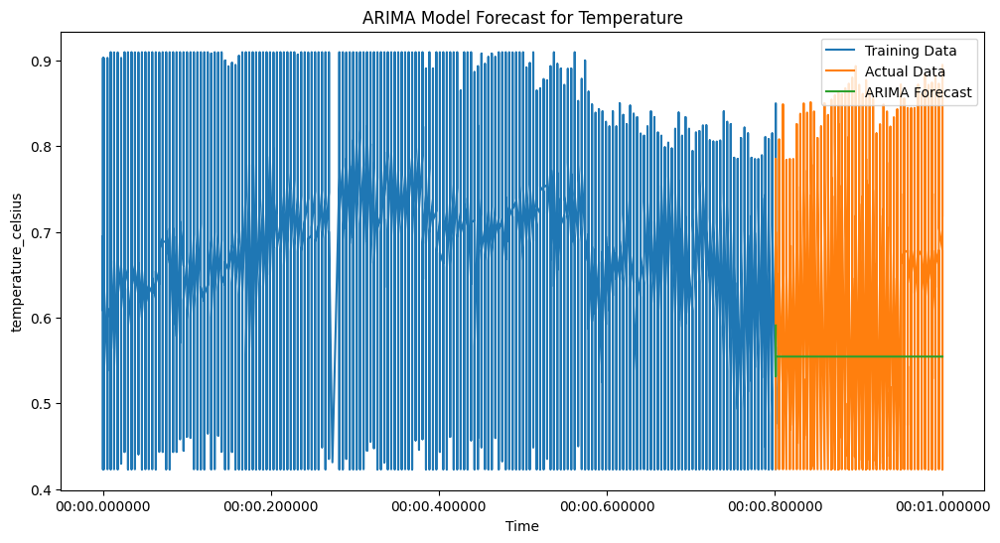

ARIMA Model Performance:
MAE: 0.11401816893958726
                                SARIMAX Results                                
Dep. Variable:     temperature_celsius   No. Observations:                37573
Model:                  ARIMA(5, 1, 0)   Log Likelihood               32292.617
Date:                 Tue, 14 Jan 2025   AIC                         -64573.234
Time:                         19:55:01   BIC                         -64522.030
Sample:                              0   HQIC                        -64556.978
                               - 37573                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7733      0.005   -164.768      0.000      -0.782      -0.764
ar.L2         -0.6433      0.006   -108.663      0.000      -0.655      -

In [43]:
def arima_forecast_given_dataset(data, target_column, order=(5, 1, 0)):


    if 'last_updated_epoch' not in data.columns:
        raise KeyError("The 'last_updated_epoch' column is missing. Ensure it exists in the dataset.")
    data['last_updated'] = pd.to_datetime(data['last_updated_epoch'], unit='s')  # Convert epoch to datetime
    data.set_index('last_updated', inplace=True)
    y = data[target_column].dropna()
    train_size = int(len(y) * 0.8)
    y_train, y_test = y[:train_size], y[train_size:]
    model = ARIMA(y_train, order=order)
    arima_result = model.fit()
    forecast = arima_result.forecast(steps=len(y_test))
    plt.figure(figsize=(12, 6))
    plt.plot(y_train, label='Training Data')
    plt.plot(y_test, label='Actual Data')
    plt.plot(y_test.index, forecast, label='ARIMA Forecast')
    plt.legend()
    plt.title("ARIMA Model Forecast for Temperature")
    plt.xlabel("Time")
    plt.ylabel(target_column)
    plt.show()
    mae = mean_absolute_error(y_test, forecast)
    print("ARIMA Model Performance:")
    print(f"MAE: {mae}")
    print(arima_result.summary())


k=arima_forecast_given_dataset(weather_data, target_column='temperature_celsius', order=(5, 1, 0))
print(k)


SARIMA Model

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsm

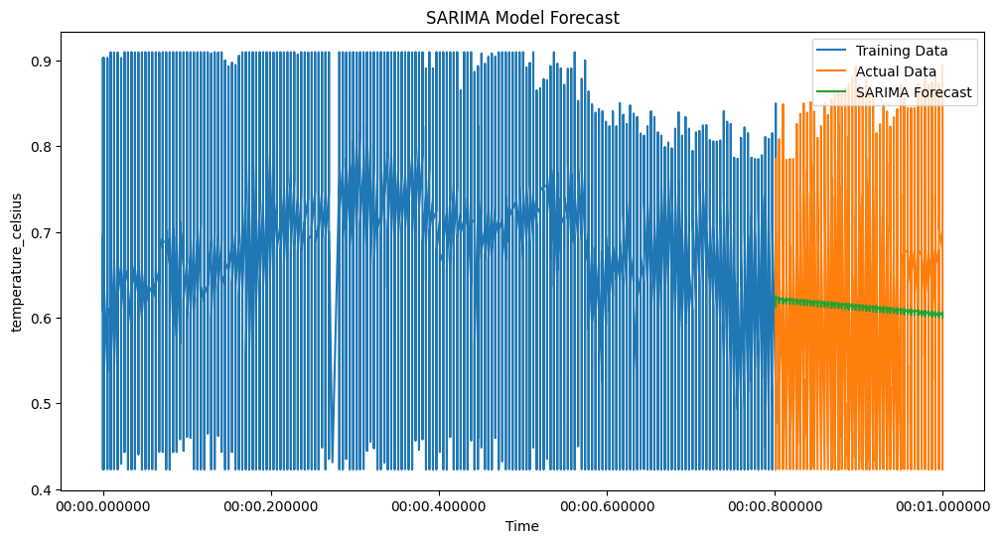

SARIMA Model Performance:
MAE: 0.0955883756752361
                                     SARIMAX Results                                      
Dep. Variable:                temperature_celsius   No. Observations:                37573
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 12)   Log Likelihood               35461.299
Date:                            Tue, 14 Jan 2025   AIC                         -70912.598
Time:                                    19:59:16   BIC                         -70869.931
Sample:                                         0   HQIC                        -70899.052
                                          - 37573                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0287      0.005      5.944      0.000       0.0

In [44]:
def sarima_forecast(data, target_column, seasonal_order=(1, 1, 1, 12), order=(1, 1, 1)):

    if 'last_updated_epoch' not in data.columns:
        raise KeyError("The 'last_updated_epoch' column is missing. Ensure it exists in the dataset.")

    data['last_updated'] = pd.to_datetime(data['last_updated_epoch'], unit='s')
    data.set_index('last_updated', inplace=True)
    y = data[target_column].dropna()
    train_size = int(len(y) * 0.8)
    y_train, y_test = y[:train_size], y[train_size:]
    model = SARIMAX(y_train, order=order, seasonal_order=seasonal_order, enforce_stationarity=False, enforce_invertibility=False)
    sarima_result = model.fit()
    forecast = sarima_result.forecast(steps=len(y_test))
    plt.figure(figsize=(12, 6))
    plt.plot(y_train, label='Training Data')
    plt.plot(y_test, label='Actual Data')
    plt.plot(y_test.index, forecast, label='SARIMA Forecast')
    plt.legend()
    plt.title("SARIMA Model Forecast")
    plt.xlabel("Time")
    plt.ylabel(target_column)
    plt.show()
    mae = mean_absolute_error(y_test, forecast)
    print("SARIMA Model Performance:")
    print(f"MAE: {mae}")
    print(sarima_result.summary())


k=sarima_forecast(weather_data, target_column='temperature_celsius', seasonal_order=(1, 1, 1, 12), order=(1, 1, 1))
print(k)

Climate Analysis

Climate Analysis:
location_name
Grindavik               0.456832
Washington Harbor       0.462979
Reykjavik               0.467568
Washington Park         0.479054
Quito                   0.484462
                          ...   
Riyadh                  0.791503
Doha                    0.796798
Krasnyy Turkmenistan    0.845946
Morocco City            0.879730
Kuwait                  0.909459
Name: temperature_celsius, Length: 248, dtype: float64


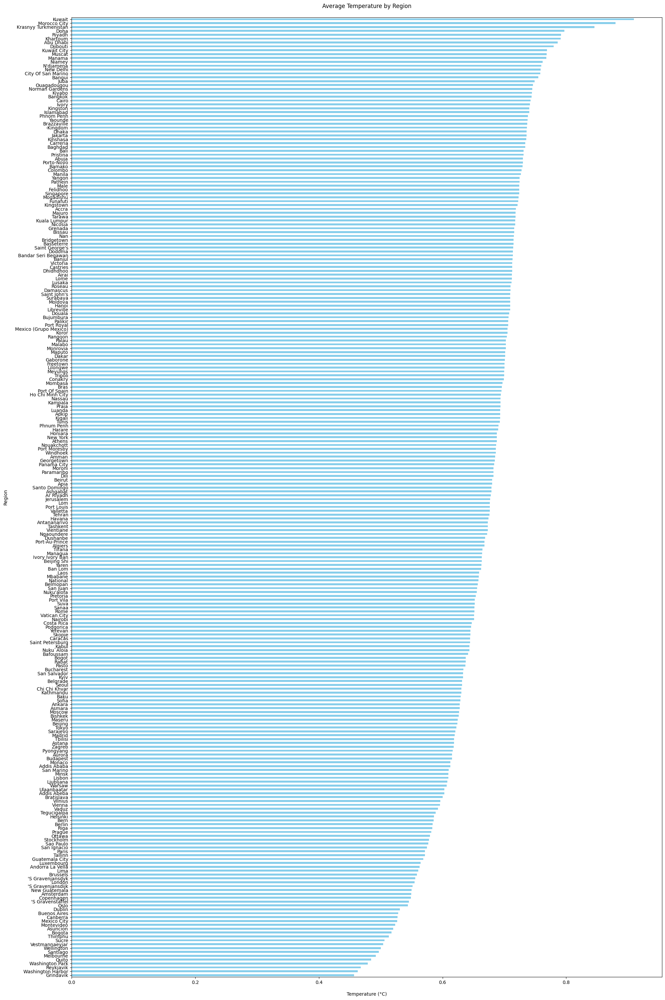

In [51]:
def climate_analysis(data):
    print("Climate Analysis:")
    regional_temperature = data.groupby('location_name')['temperature_celsius'].mean()
    print(regional_temperature.sort_values())
    plt.figure(figsize=(20, 30))
    regional_temperature.sort_values().plot(kind='barh', color='skyblue')
    plt.title("Average Temperature by Region", pad=20)
    plt.xlabel("Temperature (°C)", labelpad=15)
    plt.ylabel("Region", labelpad=15)
    plt.tight_layout()
    plt.show()

plot = climate_analysis(weather_data)


Environment Impact Analysis using pair plot

Environmental Impact Analysis:
Correlation between temperature and air_quality_Carbon_Monoxide: -0.14
Correlation between temperature and air_quality_Ozone: 0.27
Correlation between temperature and air_quality_Nitrogen_dioxide: -0.30
Correlation between temperature and air_quality_Sulphur_dioxide: -0.13
Correlation between temperature and air_quality_PM2.5: -0.01
Correlation between temperature and air_quality_PM10: -0.00
Correlation between temperature and air_quality_us-epa-index: -0.01
Correlation between temperature and air_quality_gb-defra-index: -0.01


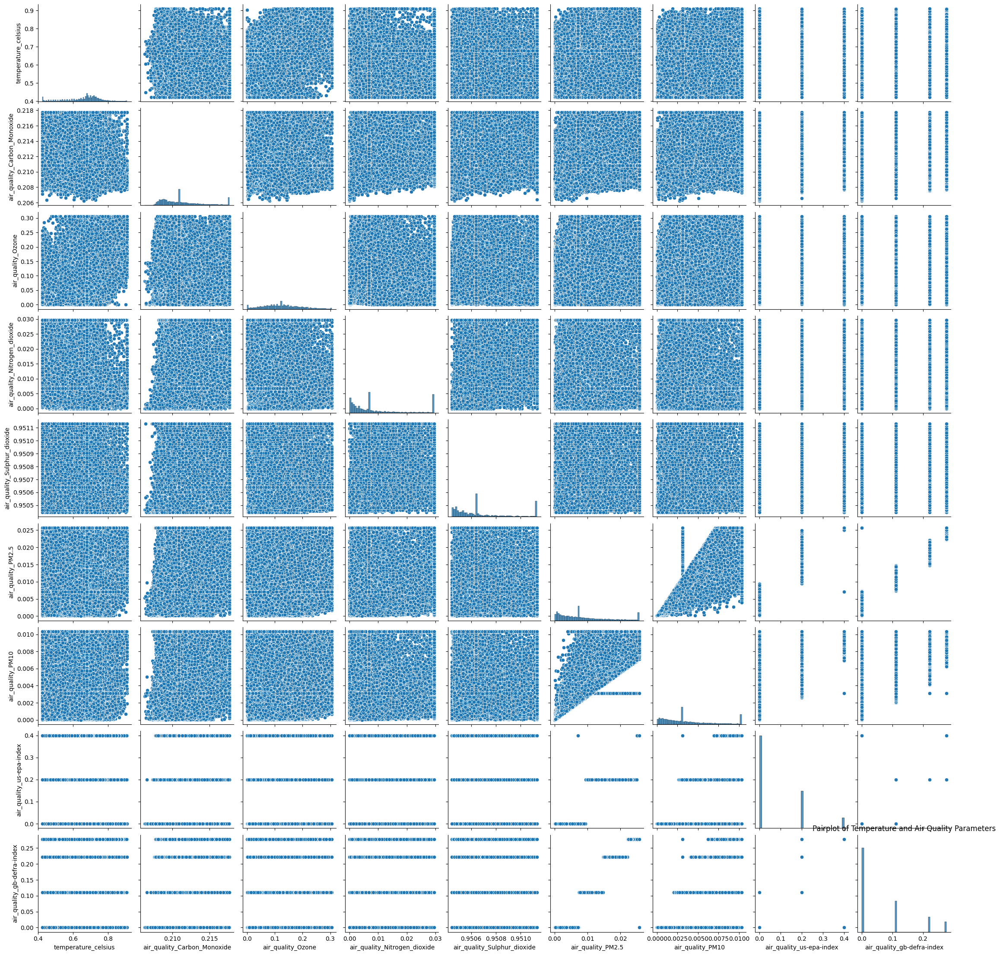

In [52]:
def environmental_impact_analysis(data):
    print("Environmental Impact Analysis:")
    air_quality_cols = [col for col in data.columns if 'air_quality' in col]
    for col in air_quality_cols:
        correlation = data[['temperature_celsius', col]].corr().iloc[0, 1]
        print(f"Correlation between temperature and {col}: {correlation:.2f}")

    sns.pairplot(data, vars=['temperature_celsius'] + air_quality_cols)
    plt.title("Pairplot of Temperature and Air Quality Parameters")
    plt.show()
plot=environmental_impact_analysis(weather_data)


Feature Importance analysis using random forest regressor

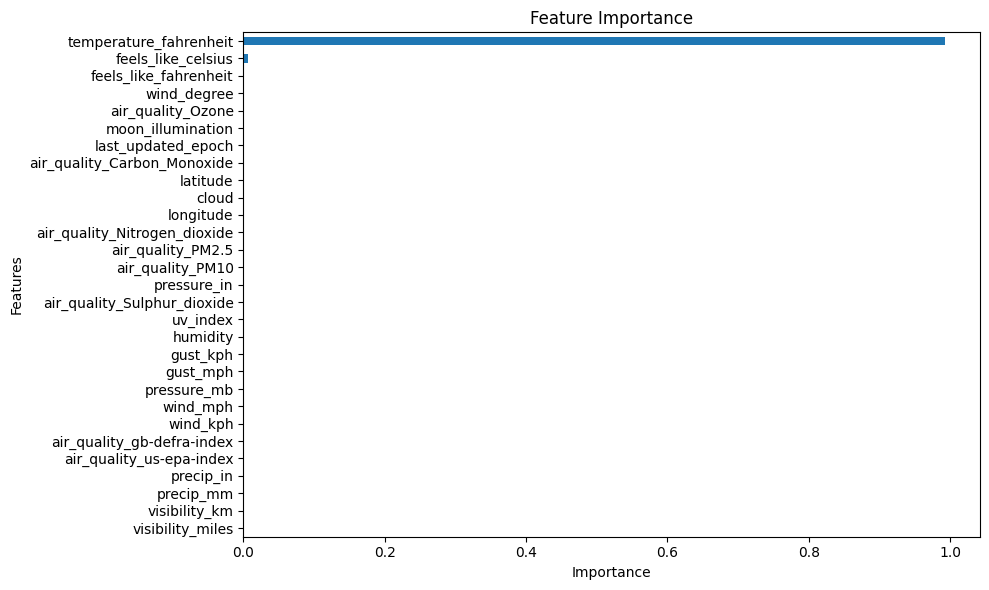

None


In [54]:
def feature_importance_analysis(data, target_column):
    from sklearn.ensemble import RandomForestRegressor
    if 'last_updated_epoch' in data.columns:
        data['last_updated'] = pd.to_datetime(data['last_updated_epoch'], unit='s')
    predictors = data.select_dtypes(include=['float64', 'int64']).drop(columns=[target_column]).dropna()
    target = data[target_column]

    rf = RandomForestRegressor()
    rf.fit(predictors, target)
    importances = pd.Series(rf.feature_importances_, index=predictors.columns)
    importances.sort_values().plot(kind='barh', figsize=(10, 6))
    plt.title("Feature Importance")
    plt.xlabel("Importance")
    plt.ylabel("Features")
    plt.tight_layout()
    plt.show()
c=feature_importance_analysis(weather_data, target_column='temperature_celsius')
print(c)

Spatial analysis

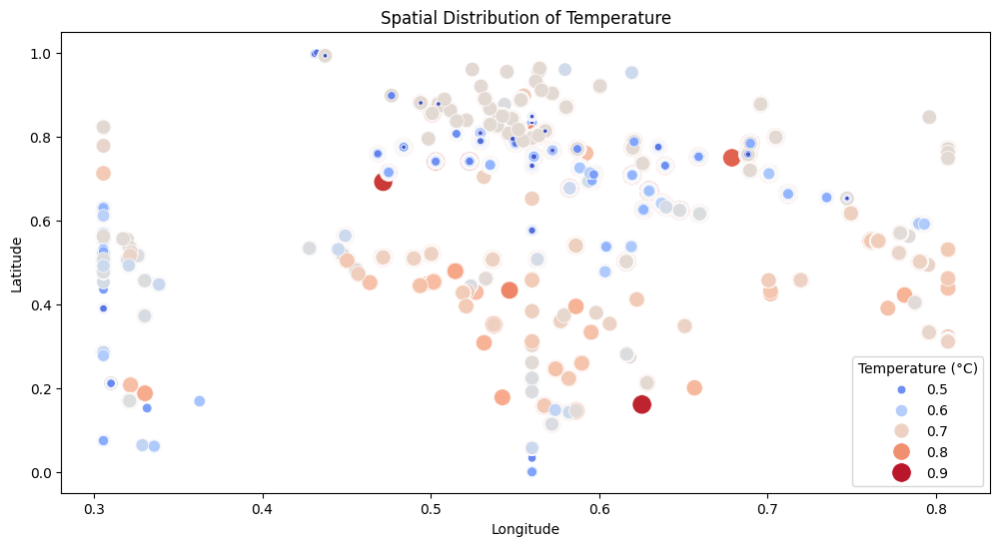

In [55]:
def spatial_analysis(data):
    plt.figure(figsize=(12, 6))
    sns.scatterplot(data=data, x='longitude', y='latitude', hue='temperature_celsius', palette='coolwarm', size='temperature_celsius', sizes=(10, 200))
    plt.title("Spatial Distribution of Temperature")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.legend(title="Temperature (°C)")
    plt.show()
spatial_analysis(weather_data)

Geographical patterns(humidity , temperature celsius)

Geographical Patterns Analysis:
                          temperature_celsius  humidity
country                                                
United States of America             0.465013  0.904202
Ecuador                              0.484462  0.766331
Iceland                              0.497040  0.810423
Chile                                0.497082  0.728631
New Zealand                          0.500095  0.808737
...                                       ...       ...
Saudi Arabia                         0.791503  0.124532
Турция                               0.794595  0.428571
Qatar                                0.796798  0.404988
Turkménistan                         0.845946  0.091837
Marrocos                             0.879730  0.122449

[210 rows x 2 columns]


<ipython-input-62-c43a7f20eef7>:14: UserWarning: Glyph 28779 (\N{CJK UNIFIED IDEOGRAPH-706B}) missing from current font.
  plt.tight_layout()
<ipython-input-62-c43a7f20eef7>:14: UserWarning: Glyph 40481 (\N{CJK UNIFIED IDEOGRAPH-9E21}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 28779 (\N{CJK UNIFIED IDEOGRAPH-706B}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 40481 (\N{CJK UNIFIED IDEOGRAPH-9E21}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


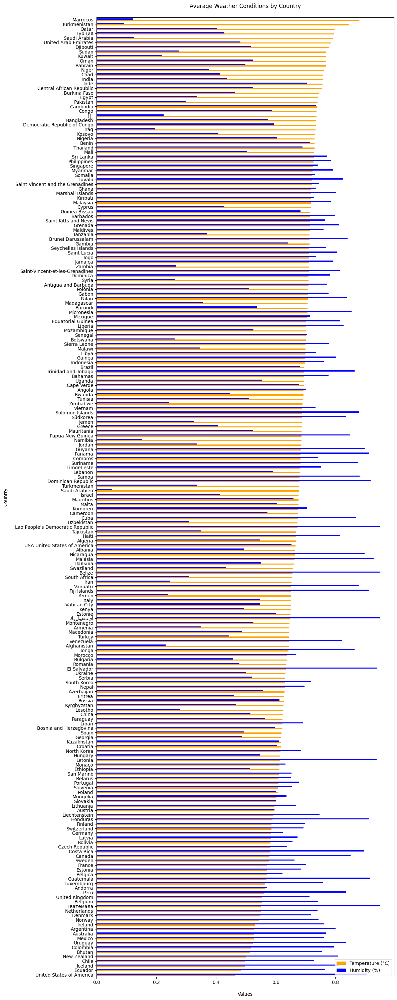

In [62]:
def geographical_patterns(data):
    print("Geographical Patterns Analysis:")
    country_weather = data.groupby('country')[['temperature_celsius', 'humidity']].mean()
    print(country_weather.sort_values('temperature_celsius'))
    country_weather.sort_values('temperature_celsius').plot(
        kind='barh',
        figsize=(12, 30),
        color=['orange', 'blue']
    )
    plt.title("Average Weather Conditions by Country", pad=20)
    plt.xlabel("Values", labelpad=15)
    plt.ylabel("Country", labelpad=15)
    plt.legend(["Temperature (°C)", "Humidity (%)"], loc="lower right")
    plt.tight_layout()
    plt.show()
geographical_patterns(weather_data)
